In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy import io
import os
import re

In [2]:
# This function is used for transforming the true (generating) parameters onto transformed space
def transform_params(param, lower_bound, upper_bound):
    return lower_bound + ((upper_bound - lower_bound) * (1 / (1+np.exp(-param))))

# Summary

1. $\alpha$ = learning rate (0 < $\alpha$ < 1)
2. $\kappa$ = coefficient multiplied to $\alpha$ for counterfactual update (0 < $\kappa$ < 1)
3. $\beta$ = inverse temperature (0 < $\beta$ < 10)
4. $w$ = model-based vs. model-free (0 < $w$ < 1)
5. $\gamma$ = decay rate (0 < $\gamma$ < 1)

C1 = counterfactual with 1 learning rate ($\alpha$), C2 = counterfactual with two learning rates ($\alpha$, $\kappa\alpha$)

## 1. Pearson's correlation in "true (bounded)" parameter space


|   |          | Total 200 trials |       |       |  100 trials per first-stage state |      |      |
:---|:----------:|------------|------|------|-----------------|------|------:
| Parameter  | n second-stage states | TD         | C1    | C2    | TD              | C1   | C2   |
| **$\alpha$**  | 2        | 0.54       | 0.72  | 0.63  | 0.49            | 0.58 | 0.54 |
|   | 3        | 0.46       | 0.58  | 0.43  | 0.52            | 0.57 | 0.56 |
|   | 4        | 0.44       | 0.5   | 0.42  | 0.49            | 0.59 | 0.54 |
|   | 5        | 0.39       | 0.4   | 0.36  | 0.54            | 0.57 | 0.49 |
| **$\kappa$**  | 2        |            |       | 0.4   |                 |      | 0.32 |
|   | 3        |            |       | 0.42  |                 |      | 0.5  |
|   | 4        |            |       | 0.35  |                 |      | 0.51 |
|   | 5        |            |       | 0.35  |                 |      | 0.54 |
| **$\beta$**  | 2        | 0.72       | 0.83  | 0.8   | 0.71            | 0.72 | 0.71 |
|   | 3        | 0.53       | 0.54  | 0.55  | 0.65            | 0.71 | 0.62 |
|   | 4        | 0.54       | 0.53  | 0.49  | 0.59            | 0.58 | 0.58 |
|   | 5        | 0.48       | 0.47  | 0.45  | 0.63            | 0.62 | 0.59 |
| **$w$**  | 2        | 0.65       | 0.66  | 0.62  | 0.58            | 0.54 | 0.48 |
|   | 3        | 0.56       | 0.64  | 0.54  | 0.68            | 0.66 | 0.64 |
|   | 4        | 0.55       | 0.52  | 0.5   | 0.63            | 0.65 | 0.62 |
|   | 5        | 0.49       | 0.52  | 0.48  | 0.68            | 0.69 | 0.68 |
| **$\gamma$**  | 2        | 0.57       | -0.05 | -0.03 | 0.48            | 0.04 | 0.02 |
|   | 3        | 0.51       | 0.57  | 0.51  | 0.65            | 0.62 | 0.59 |
|   | 4        | 0.52       | 0.47  | 0.47  | 0.62            | 0.66 | 0.6  |
|   | 5        | 0.42       | 0.49  | 0.46  | 0.62            | 0.68 | 0.67 |


 
 * Notes & thoughts:
1. 100 trials per first-stage state: experiments with 2 second-stage states have 100, 3 states have 300, 4 states have 600, and 5 states have 1000 total trials. Overall, more number of trials improve better than counterfactual alone for higher nstates.
2. $\gamma$s are 0 for counterfactual experiments with 2 second-stage states. This is because in 2-state condition in counterfactual settings you see the one and only first-stage-state every trial, so there's nothing to discount.

## 2. Pearson's correlation in "transformed" parameter space 

|   |          | Total 200 trials |       |       |  100 trials per first-stage state |      |      |
|---|----------|------------|-------|-------|-----------------|------|------|
| Parameter  | n second-stage states | TD         | C1    | C2    | TD              | C1   | C2   |
| **$\alpha$**  | 2        | 0.52       | 0.69  | 0.61  | 0.49            | 0.56 | 0.53 |
|   | 3        | 0.45       | 0.57  | 0.43  | 0.51            | 0.55 | 0.55 |
|   | 4        | 0.44       | 0.47  | 0.41  | 0.49            | 0.57 | 0.53 |
|   | 5        | 0.4        | 0.4   | 0.37  | 0.55            | 0.54 | 0.48 |
| **$\kappa$**  | 2        |            |       | 0.42  |                 |      | 0.33 |
|   | 3        |            |       | 0.42  |                 |      | 0.5  |
|   | 4        |            |       | 0.35  |                 |      | 0.51 |
|   | 5        |            |       | 0.35  |                 |      | 0.53 |
| **$\beta$**  | 2        | 0.51       | 0.57  | 0.55  | 0.53            | 0.47 | 0.53 |
|   | 3        | 0.42       | 0.41  | 0.39  | 0.51            | 0.53 | 0.44 |
|   | 4        | 0.42       | 0.37  | 0.36  | 0.46            | 0.4  | 0.44 |
|   | 5        | 0.38       | 0.36  | 0.37  | 0.48            | 0.4  | 0.43 |
|  **$w$** | 2        | 0.64       | 0.64  | 0.61  | 0.58            | 0.54 | 0.48 |
|   | 3        | 0.55       | 0.63  | 0.53  | 0.67            | 0.64 | 0.62 |
|   | 4        | 0.54       | 0.51  | 0.51  | 0.62            | 0.63 | 0.62 |
|   | 5        | 0.49       | 0.52  | 0.47  | 0.66            | 0.68 | 0.66 |
| **$\gamma$**  | 2        | 0.55       | -0.05 | -0.03 | 0.48            | 0.04 | 0.02 |
|   | 3        | 0.48       | 0.55  | 0.49  | 0.62            | 0.6  | 0.55 |
|   | 4        | 0.48       | 0.45  | 0.45  | 0.59            | 0.62 | 0.57 |
|   | 5        | 0.37       | 0.47  | 0.42  | 0.57            | 0.64 | 0.65 |

* Notes & thoughts
1. 100 trials per first-stage state: experiments with 2 second-stage states have 100, 3 states have 300, 4 states have 600, and 5 states have 1000 total trials. Overall, more number of trials improve better than counterfactual alone for higher nstates.
2. $\gamma$s are 0 for counterfactual experiments with 2 second-stage states. This is because in 2-state condition in counterfactual settings you see the one and only first-stage-state every trial, so there's nothing to discount.
3. $\beta$ drops when the correlation is done in transformed paramter space vs. true parameter space. Could it be because $\beta$ has different true range (0<$\beta$<10) than all other parameters (0<rest<1)?

# 1. Total number of trials fixed to 200

## 1-1) TD (no counterfactual)

The r for alpha 2 stages: 0.54
The r2 for alpha 2 stages: 0.29
The correlation coefficient for alpha 2 stages: 0.52
The r for alpha 3 stages: 0.46
The r2 for alpha 3 stages: 0.21
The correlation coefficient for alpha 3 stages: 0.45
The r for alpha 4 stages: 0.44
The r2 for alpha 4 stages: 0.19
The correlation coefficient for alpha 4 stages: 0.44
The r for alpha 5 stages: 0.39
The r2 for alpha 5 stages: 0.15
The correlation coefficient for alpha 5 stages: 0.4
The r for beta 2 stages: 0.72
The r2 for beta 2 stages: 0.52
The correlation coefficient for beta 2 stages: 0.51
The r for beta 3 stages: 0.53
The r2 for beta 3 stages: 0.28
The correlation coefficient for beta 3 stages: 0.42
The r for beta 4 stages: 0.54
The r2 for beta 4 stages: 0.29
The correlation coefficient for beta 4 stages: 0.42
The r for beta 5 stages: 0.48
The r2 for beta 5 stages: 0.23
The correlation coefficient for beta 5 stages: 0.38
The r for w 2 stages: 0.65
The r2 for w 2 stages: 0.42
The correlation coefficient fo

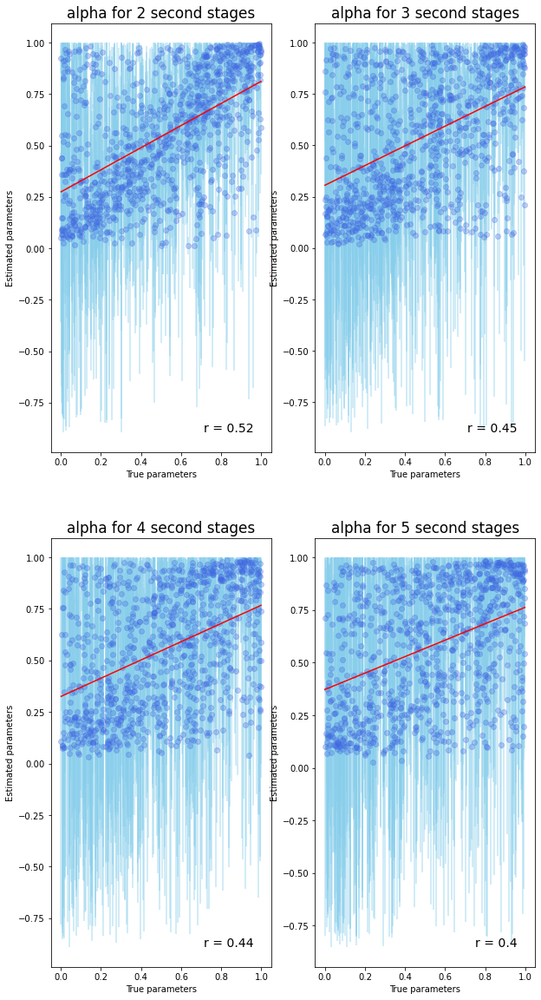

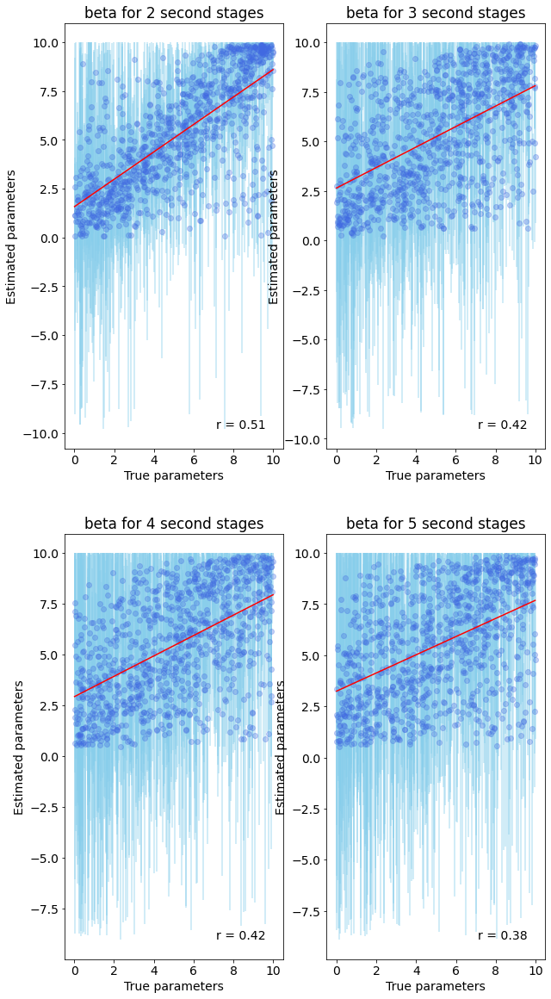

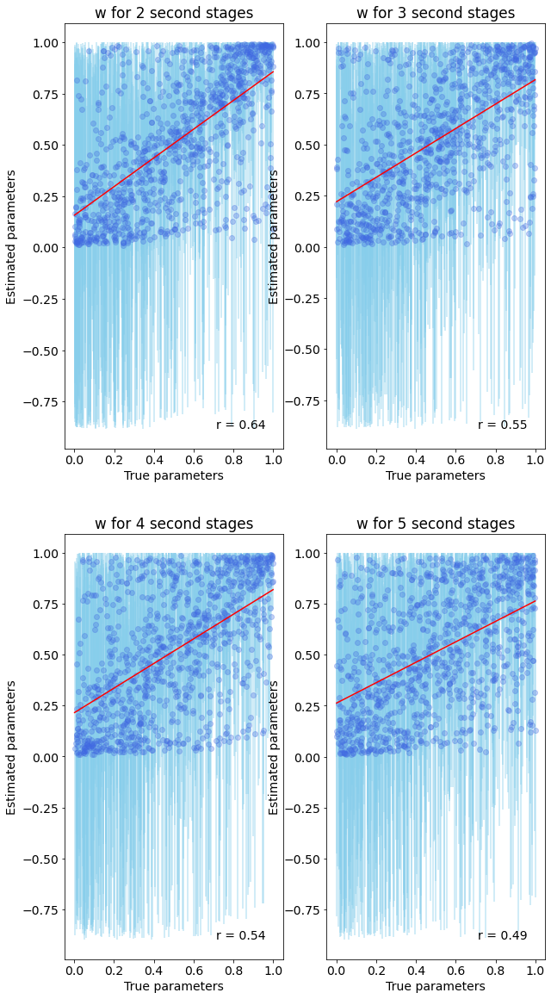

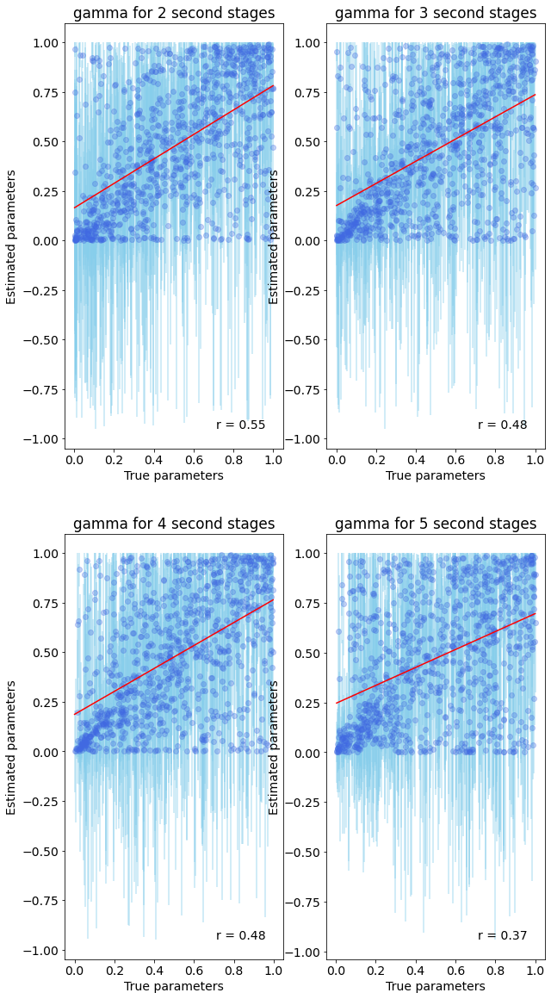

In [3]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
#             lower_bound = 0.001
            upper_bound = 10
        transformed_param = transform_params(x,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2
        
#         corr_coef = np.corrcoef(x,y)[0,1]
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
        print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

for i in datatable:
    print(i)

In [4]:
s = 2
i = 0
# debugging for alpha in 3 states

file = 'recovery_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'

curr_file = io.loadmat(file)
CI_table = curr_file['data']['CI_table']
CI_table = np.asarray(CI_table)[0][0]
corrtable = curr_file['data']['corrtable']
corrtable = np.asarray(corrtable)[0][0]
raw_table = curr_file['data']['raw_recovered']
raw_table = np.asarray(raw_table)[0][0]

num_data = len(corrtable)

num_data
np.shape(raw_table)
raw_table

array([[-1.27040461, -0.6137689 ,  0.39812444,  1.78165685],
       [-0.44012287,  0.38918336,  3.02748305, -0.57087519],
       [-0.08822747, -0.23238267, -0.44924914, -1.77757645],
       ...,
       [-1.58331822,  0.53873488, -2.44802254, -0.6805902 ],
       [-1.33428987,  1.41343657,  1.64615045,  0.90534565],
       [ 3.02375823,  3.56400843, -2.04600966,  1.62825719]])

In [5]:
true_params = corrtable[:num_data,i*2]
np.shape(true_params)
true_params
# now transform the true_params into 'transformed space'
# Below is from matlab likfun_TD_counterfactual
# % Lower_bound + ((Upper_bound-Lower_bound) * inverse logit(param))
# lr              =  0 + (1 * (1./[1+exp(-lr)]));
# kappa              =  0 + (1 * (1./[1+exp(-kappa)]));
# beta            =  0 + (10 * (1./[1+exp(-beta)]));
# w               =  0 + (1 * (1./[1+exp(-w)]));
# gamma           =  0 + (1 * (1./[1+exp(-gamma)]));



array([0.27516755, 0.73736543, 0.43336517, 0.37680375, 0.32004605,
       0.26364527, 0.08481243, 0.18640034, 0.2852056 , 0.06904428,
       0.37495188, 0.53794258, 0.37565985, 0.27542962, 0.49895878,
       0.66118673, 0.99545575, 0.30549252, 0.61364701, 0.89990318,
       0.04154348, 0.62600117, 0.10236387, 0.85481873, 0.75982397,
       0.88546391, 0.15039091, 0.23778069, 0.56598726, 0.72124413,
       0.59673565, 0.00759319, 0.09236195, 0.32918485, 0.33032555,
       0.54992527, 0.89979192, 0.33523085, 0.54777897, 0.3344179 ,
       0.93644987, 0.23097673, 0.12781505, 0.29652038, 0.74860809,
       0.29430601, 0.07112507, 0.19863221, 0.7140004 , 0.753628  ,
       0.35672805, 0.96470262, 0.55315905, 0.33059594, 0.87184969,
       0.09449363, 0.3184734 , 0.84399354, 0.75348355, 0.9769933 ,
       0.86747718, 0.93594664, 0.5738234 , 0.94013777, 0.25381733,
       0.33222486, 0.20322543, 0.58943383, 0.8221556 , 0.24139838,
       0.83511873, 0.48978441, 0.65788009, 0.05388734, 0.79473

In [6]:
np.max(true_params)

0.9984120540001515

In [7]:
def transform_params(param, lower_bound, upper_bound):
    return lower_bound + ((upper_bound - lower_bound) * (1 / (1+np.exp(-param))))

transformed_alpha = transform_params(true_params, 0, 1)
transformed_alpha

array([0.56836109, 0.67641948, 0.60667695, 0.59310198, 0.57933547,
       0.56553217, 0.52119041, 0.54646562, 0.57082198, 0.51725422,
       0.59265498, 0.63133368, 0.59282589, 0.56842538, 0.62221461,
       0.65952692, 0.73016419, 0.57578466, 0.64877229, 0.71092961,
       0.51038438, 0.65158219, 0.52556864, 0.701577  , 0.68131552,
       0.7079532 , 0.53752702, 0.55916666, 0.63783674, 0.67288092,
       0.64490912, 0.50189829, 0.52307409, 0.58156102, 0.58183859,
       0.63411825, 0.71090674, 0.58303158, 0.63362014, 0.58283393,
       0.71838199, 0.55748882, 0.53191033, 0.57359167, 0.67887533,
       0.57304999, 0.51777377, 0.54949542, 0.6712845 , 0.67996871,
       0.58824816, 0.72406236, 0.6348682 , 0.58190437, 0.70513043,
       0.52360585, 0.57895216, 0.69930563, 0.67993727, 0.72651121,
       0.70422048, 0.71828017, 0.63964494, 0.71912749, 0.56311585,
       0.58230062, 0.55063221, 0.64323523, 0.69469372, 0.56005823,
       0.69743617, 0.62005564, 0.65878402, 0.51346858, 0.68884

In [8]:
np.max(transformed_alpha)

0.7307462549685

In [9]:
np.shape(raw_table)
raw_alpha = raw_table[:,0]
raw_alpha.min()

-3.4466774854738613

In [10]:
np.corrcoef(transformed_alpha, raw_alpha)

array([[1.        , 0.43830677],
       [0.43830677, 1.        ]])

In [11]:
x = corrtable[:num_data,i*2]
y = corrtable[:num_data,i*2+1]
ci_upper = CI_table[:num_data,i*2]
ci_lower = CI_table[:num_data,i*2+1]

slope, intercept = np.polyfit(x,y,1) # linear model adjustment
y_model = np.polyval([slope, intercept], x)   # modeling...

x_mean = np.mean(x)
y_mean = np.mean(y)
n = x.size                        # number of samples

## 1-2) Counterfactual: one learning rate (alpha)

The r for alpha 2 stages: 0.72
The r2 for alpha 2 stages: 0.52
The correlation coefficient for alpha 2 stages: 0.69
The r for alpha 3 stages: 0.58
The r2 for alpha 3 stages: 0.33
The correlation coefficient for alpha 3 stages: 0.57
The r for alpha 4 stages: 0.5
The r2 for alpha 4 stages: 0.25
The correlation coefficient for alpha 4 stages: 0.47
The r for alpha 5 stages: 0.4
The r2 for alpha 5 stages: 0.16
The correlation coefficient for alpha 5 stages: 0.4
The r for beta 2 stages: 0.83
The r2 for beta 2 stages: 0.68
The correlation coefficient for beta 2 stages: 0.57
The r for beta 3 stages: 0.54
The r2 for beta 3 stages: 0.29
The correlation coefficient for beta 3 stages: 0.41
The r for beta 4 stages: 0.53
The r2 for beta 4 stages: 0.28
The correlation coefficient for beta 4 stages: 0.37
The r for beta 5 stages: 0.47
The r2 for beta 5 stages: 0.23
The correlation coefficient for beta 5 stages: 0.36
The r for w 2 stages: 0.66
The r2 for w 2 stages: 0.43
The correlation coefficient for 

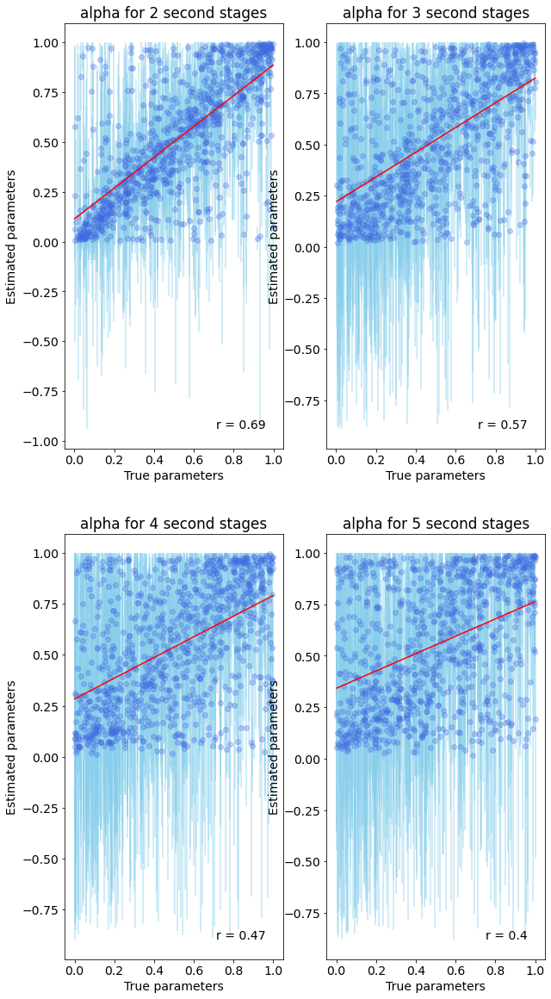

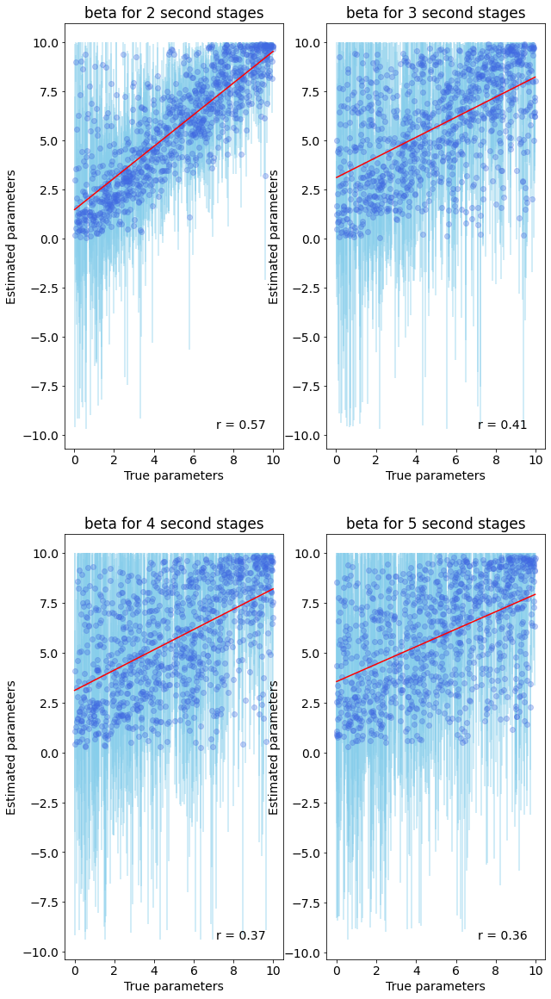

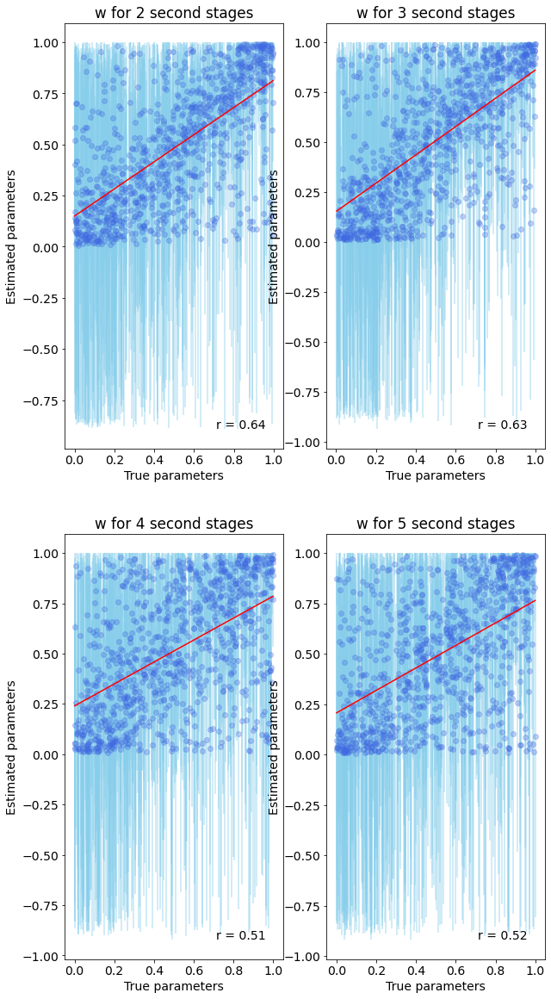

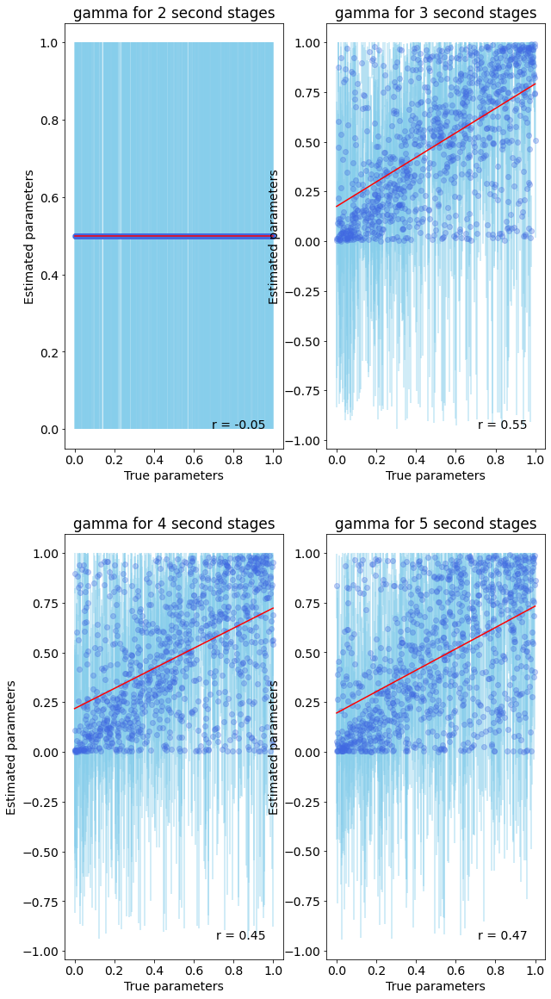

In [12]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')

    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_1alpha_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'


        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
#             lower_bound = 0.001
            upper_bound = 10
        transformed_param = transform_params(x,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2
        
#         corr_coef = np.corrcoef(x,y)[0,1]
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
        print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

for i in datatable:
    print(i)

## 1-3) Counterfactual: two learning rates 

The r for alpha 2 stages: 0.63
The r2 for alpha 2 stages: 0.4
The correlation coefficient for alpha 2 stages: 0.61
The r for alpha 3 stages: 0.43
The r2 for alpha 3 stages: 0.18
The correlation coefficient for alpha 3 stages: 0.43
The r for alpha 4 stages: 0.42
The r2 for alpha 4 stages: 0.18
The correlation coefficient for alpha 4 stages: 0.41
The r for alpha 5 stages: 0.36
The r2 for alpha 5 stages: 0.13
The correlation coefficient for alpha 5 stages: 0.37
The r for kappa 2 stages: 0.4
The r2 for kappa 2 stages: 0.16
The correlation coefficient for kappa 2 stages: 0.42
The r for kappa 3 stages: 0.42
The r2 for kappa 3 stages: 0.17
The correlation coefficient for kappa 3 stages: 0.42
The r for kappa 4 stages: 0.35
The r2 for kappa 4 stages: 0.12
The correlation coefficient for kappa 4 stages: 0.35
The r for kappa 5 stages: 0.35
The r2 for kappa 5 stages: 0.12
The correlation coefficient for kappa 5 stages: 0.35
The r for beta 2 stages: 0.8
The r2 for beta 2 stages: 0.63
The correlatio

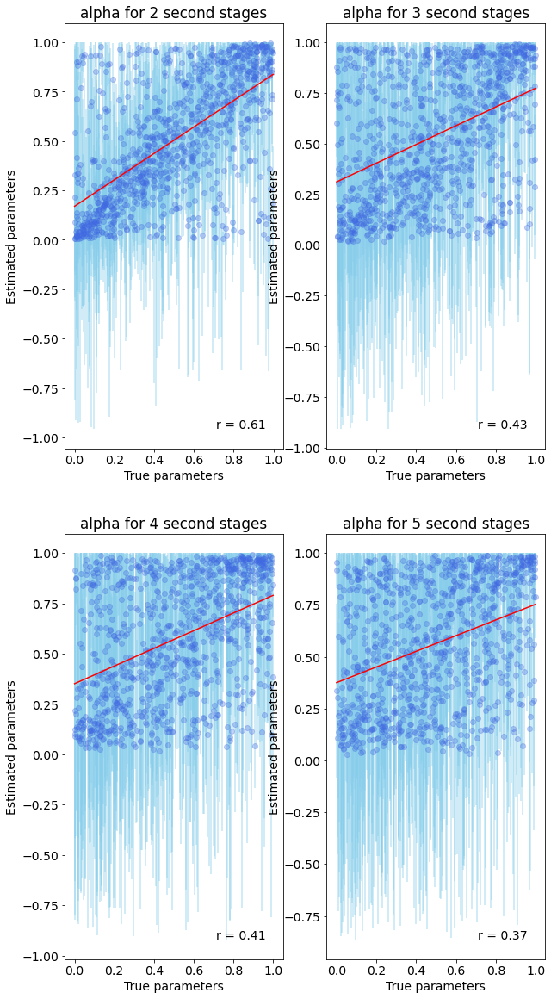

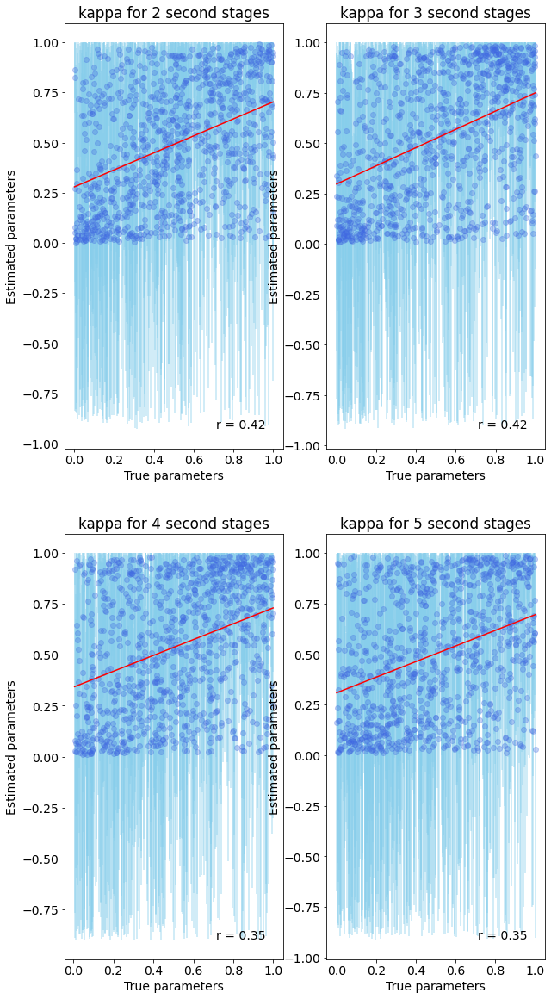

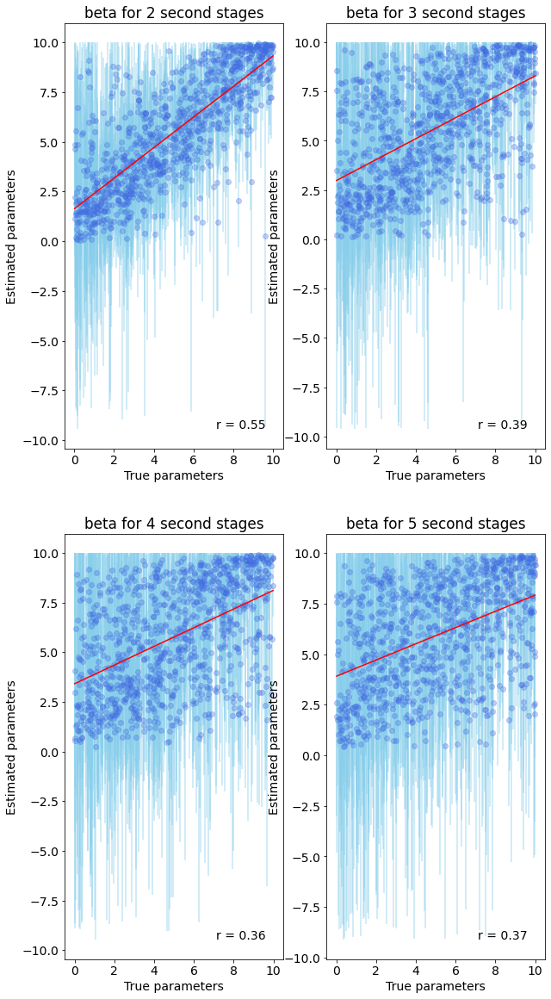

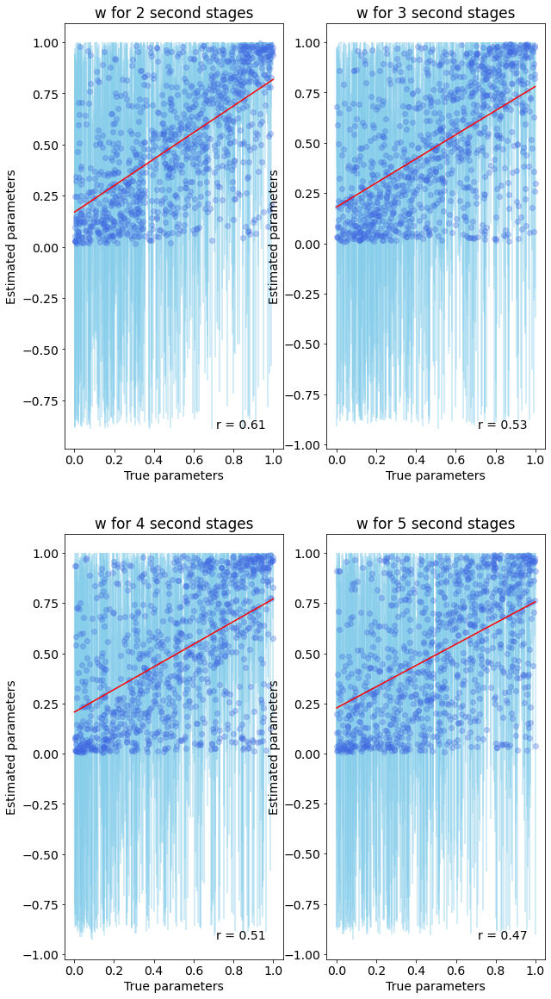

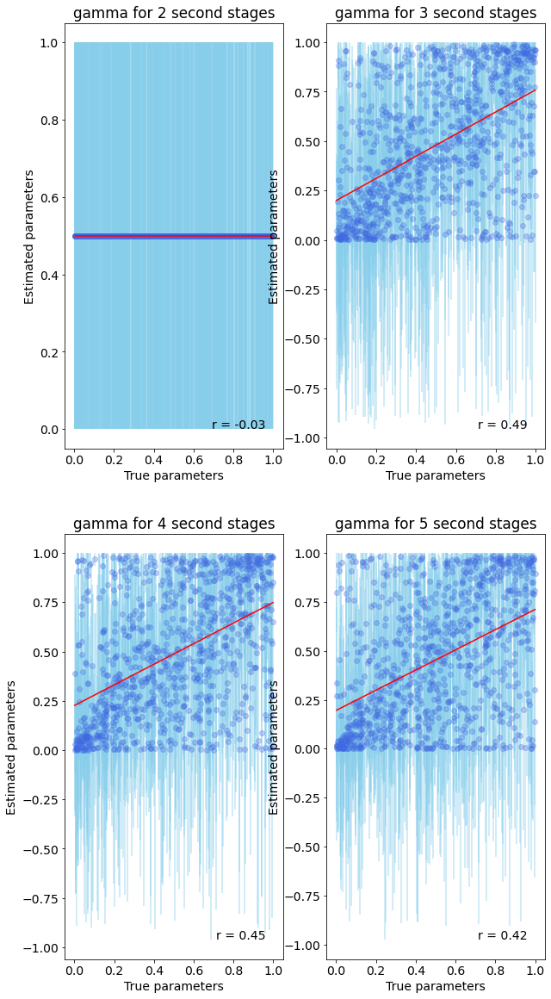

In [13]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'kappa', 'beta', 'w', 'gamma']
datatable = []
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_diff_lr_' + str(second_stages[s]) + 'states_5params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
#             lower_bound = 0.001
            upper_bound = 10
        transformed_param = transform_params(x,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2
        
#         corr_coef = np.corrcoef(x,y)[0,1]
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
        print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

for i in datatable:
    print(i)

# 2. Number of trials proportionate to number of first-stage states (100 each; 100 trials for 2, 300 trials for 3, 600 trials for 4, and 1000 trials for 5 second states)

## 2-1) TD (no counterfactual)

The r for alpha 2 stages: 0.49
The r2 for alpha 2 stages: 0.24
The correlation coefficient for alpha 2 stages: 0.49
The r for alpha 3 stages: 0.52
The r2 for alpha 3 stages: 0.27
The correlation coefficient for alpha 3 stages: 0.51
The r for alpha 4 stages: 0.49
The r2 for alpha 4 stages: 0.24
The correlation coefficient for alpha 4 stages: 0.49
The r for alpha 5 stages: 0.54
The r2 for alpha 5 stages: 0.29
The correlation coefficient for alpha 5 stages: 0.55
The r for beta 2 stages: 0.71
The r2 for beta 2 stages: 0.51
The correlation coefficient for beta 2 stages: 0.53
The r for beta 3 stages: 0.65
The r2 for beta 3 stages: 0.42
The correlation coefficient for beta 3 stages: 0.51
The r for beta 4 stages: 0.59
The r2 for beta 4 stages: 0.35
The correlation coefficient for beta 4 stages: 0.46
The r for beta 5 stages: 0.63
The r2 for beta 5 stages: 0.39
The correlation coefficient for beta 5 stages: 0.48
The r for w 2 stages: 0.58
The r2 for w 2 stages: 0.33
The correlation coefficient f

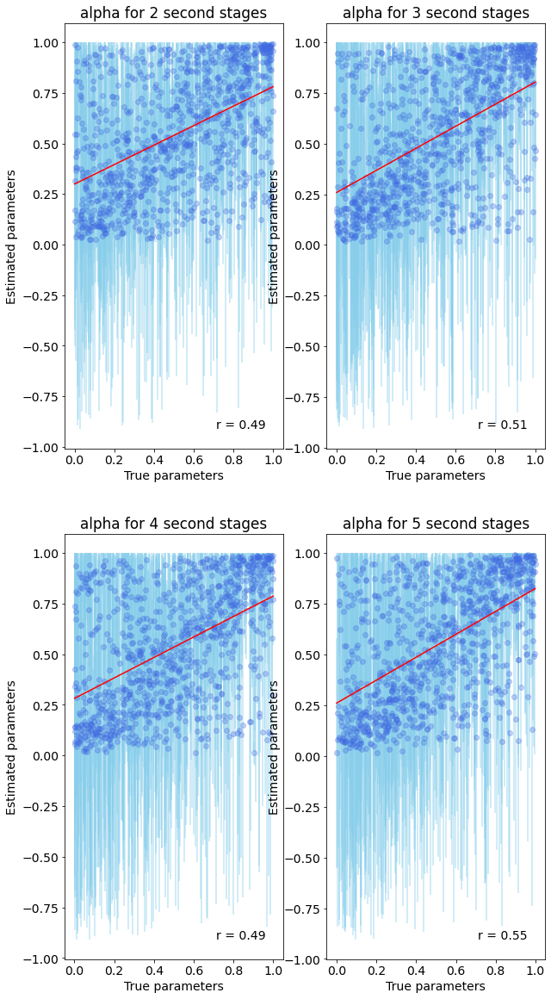

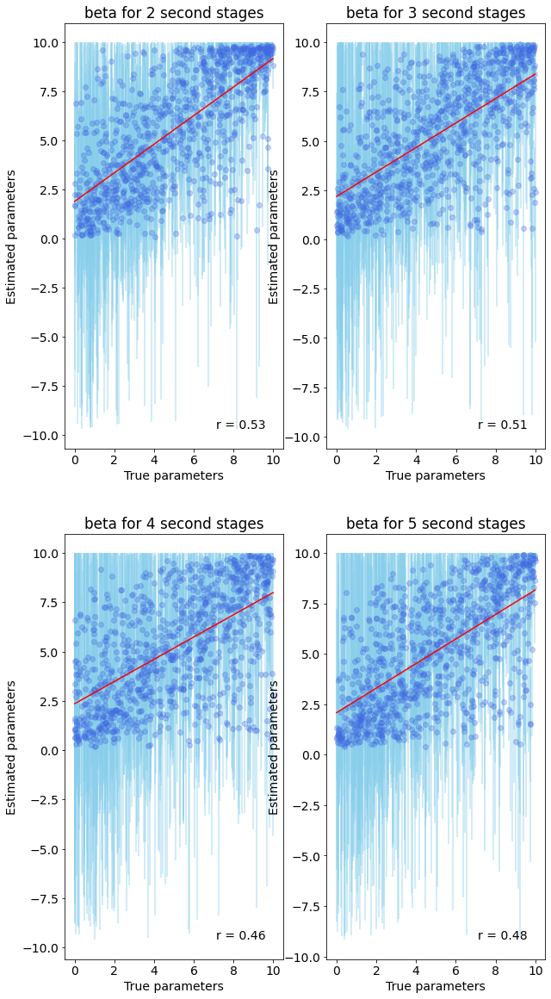

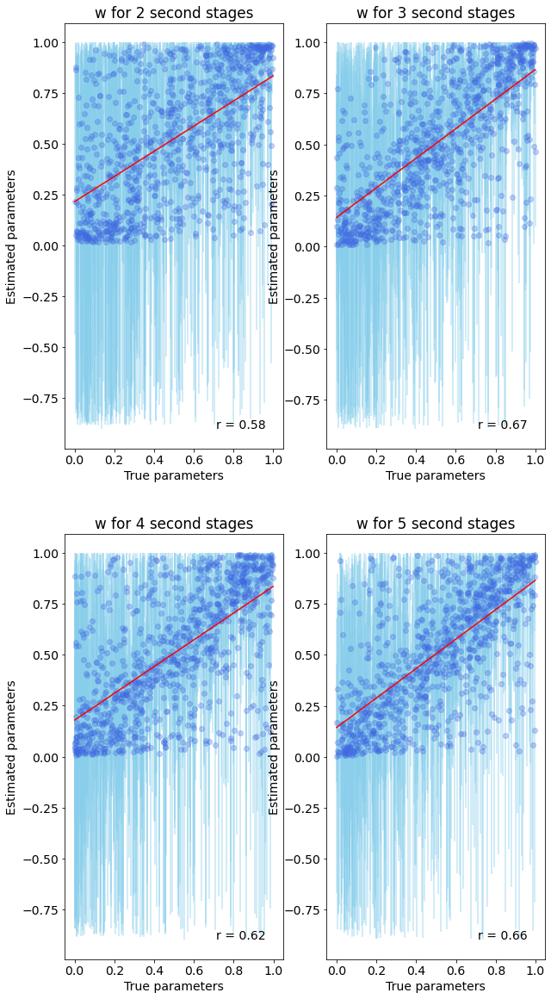

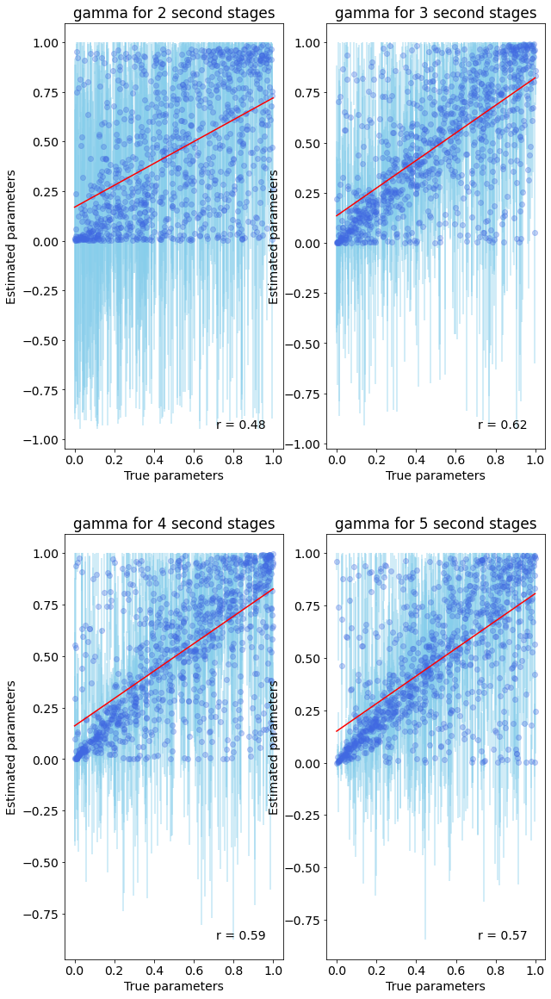

In [14]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_moretrials_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
#             lower_bound = 0.001
            upper_bound = 10
        transformed_param = transform_params(x,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2
        
#         corr_coef = np.corrcoef(x,y)[0,1]
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
        print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

for i in datatable:
    print(i)

## 2-2) Counterfactual: one learning rate (alpha)

The r for alpha 2 stages: 0.58
The r2 for alpha 2 stages: 0.33
The correlation coefficient for alpha 2 stages: 0.56
The r for alpha 3 stages: 0.57
The r2 for alpha 3 stages: 0.32
The correlation coefficient for alpha 3 stages: 0.55
The r for alpha 4 stages: 0.59
The r2 for alpha 4 stages: 0.34
The correlation coefficient for alpha 4 stages: 0.57
The r for alpha 5 stages: 0.57
The r2 for alpha 5 stages: 0.32
The correlation coefficient for alpha 5 stages: 0.54
The r for beta 2 stages: 0.72
The r2 for beta 2 stages: 0.52
The correlation coefficient for beta 2 stages: 0.47
The r for beta 3 stages: 0.71
The r2 for beta 3 stages: 0.5
The correlation coefficient for beta 3 stages: 0.53
The r for beta 4 stages: 0.58
The r2 for beta 4 stages: 0.34
The correlation coefficient for beta 4 stages: 0.4
The r for beta 5 stages: 0.62
The r2 for beta 5 stages: 0.38
The correlation coefficient for beta 5 stages: 0.4
The r for w 2 stages: 0.54
The r2 for w 2 stages: 0.29
The correlation coefficient for 

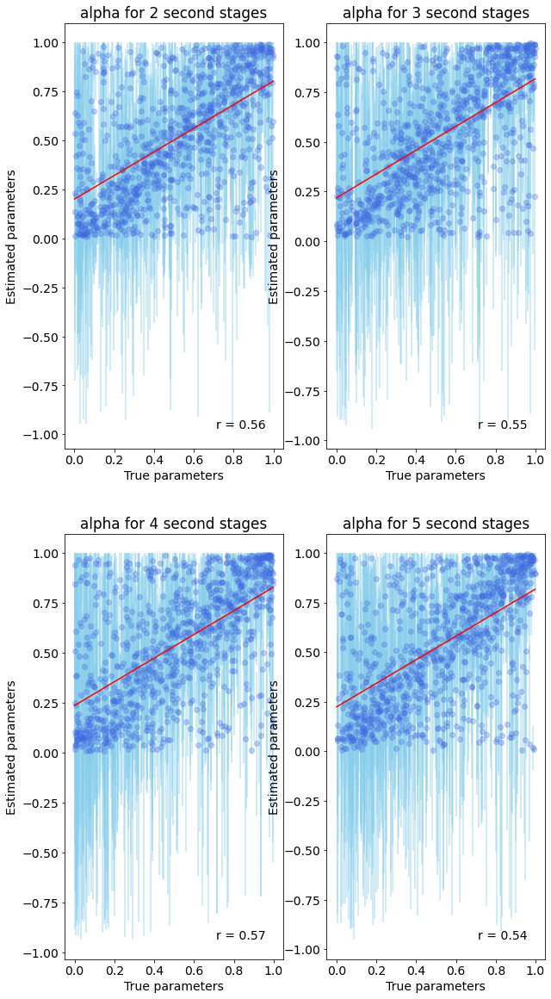

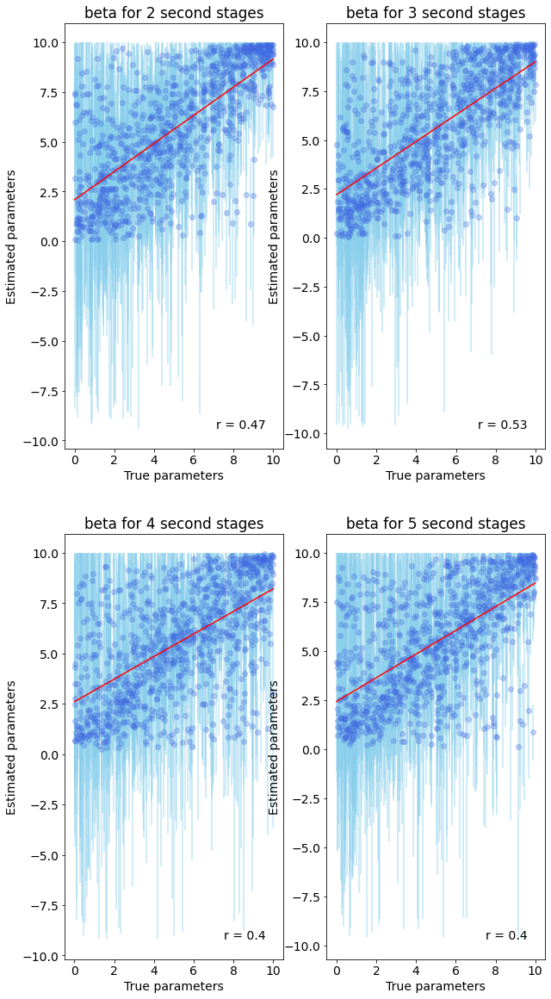

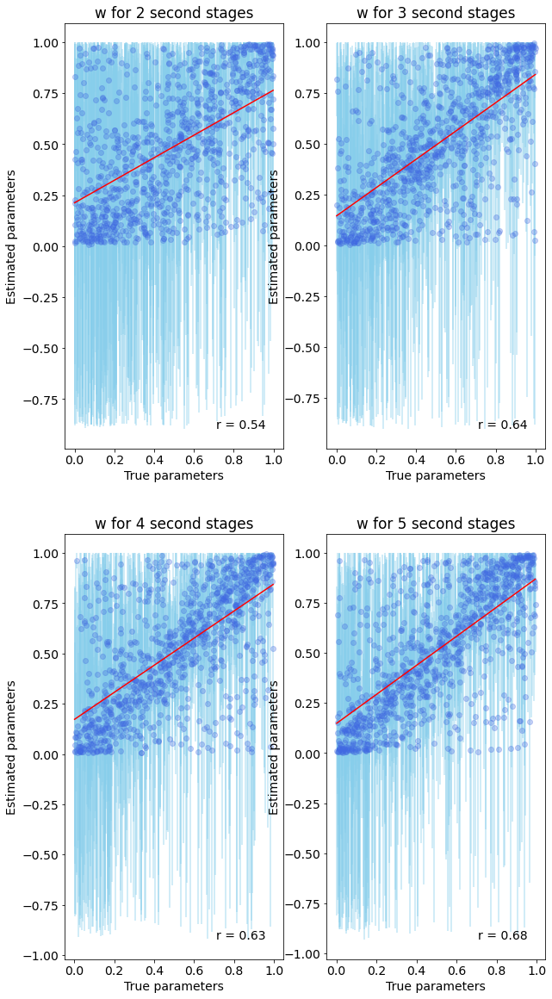

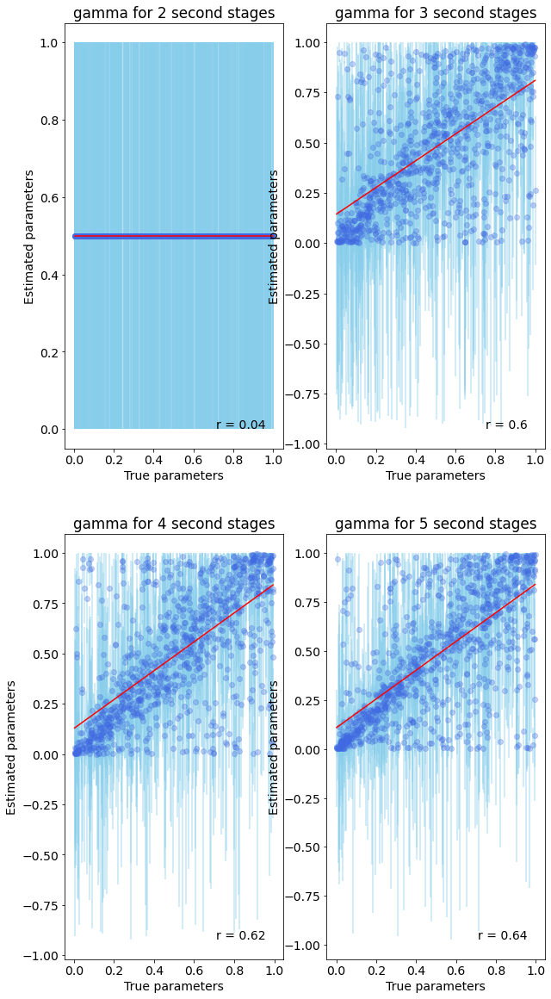

In [15]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')

    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_moretrials_1alpha_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
#             lower_bound = 0.001
            upper_bound = 10
        transformed_param = transform_params(x,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2
        
#         corr_coef = np.corrcoef(x,y)[0,1]
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
        print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

for i in datatable:
    print(i)

## 2-3. Counterfactual: two learning rates

The r for alpha 2 stages: 0.54
The r2 for alpha 2 stages: 0.3
The correlation coefficient for alpha 2 stages: 0.53
The r for alpha 3 stages: 0.56
The r2 for alpha 3 stages: 0.31
The correlation coefficient for alpha 3 stages: 0.55
The r for alpha 4 stages: 0.54
The r2 for alpha 4 stages: 0.29
The correlation coefficient for alpha 4 stages: 0.53
The r for alpha 5 stages: 0.49
The r2 for alpha 5 stages: 0.24
The correlation coefficient for alpha 5 stages: 0.48
The r for kappa 2 stages: 0.32
The r2 for kappa 2 stages: 0.1
The correlation coefficient for kappa 2 stages: 0.33
The r for kappa 3 stages: 0.5
The r2 for kappa 3 stages: 0.25
The correlation coefficient for kappa 3 stages: 0.5
The r for kappa 4 stages: 0.51
The r2 for kappa 4 stages: 0.26
The correlation coefficient for kappa 4 stages: 0.51
The r for kappa 5 stages: 0.54
The r2 for kappa 5 stages: 0.29
The correlation coefficient for kappa 5 stages: 0.53
The r for beta 2 stages: 0.71
The r2 for beta 2 stages: 0.51
The correlation

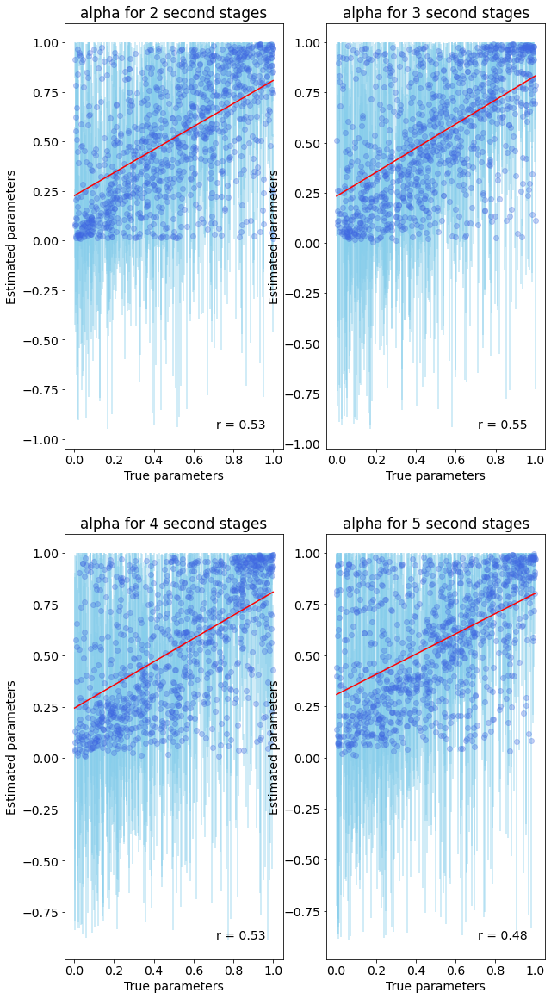

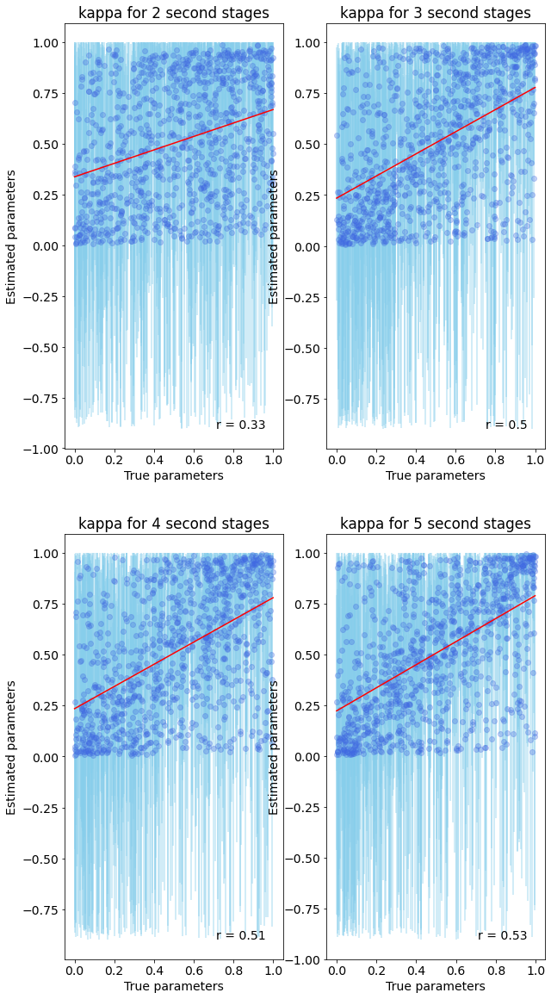

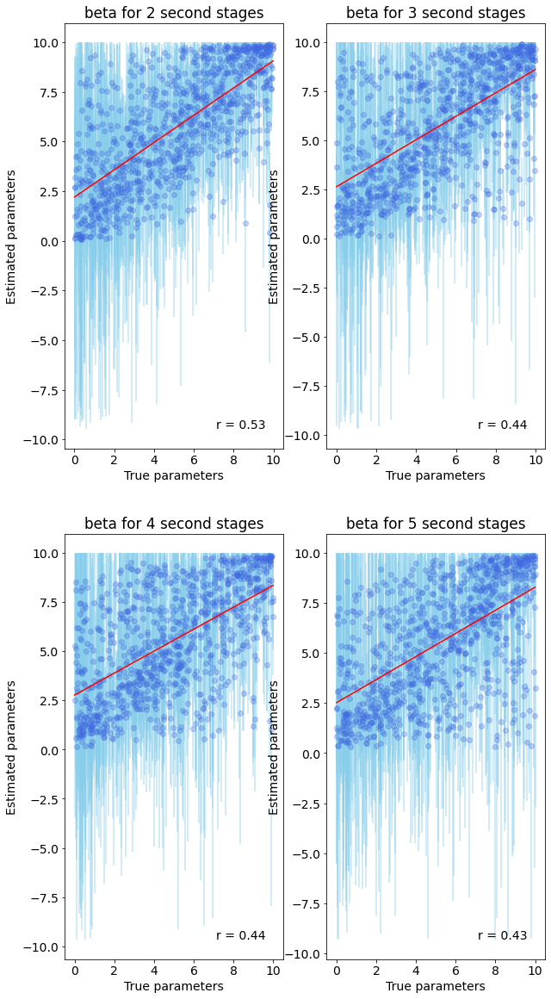

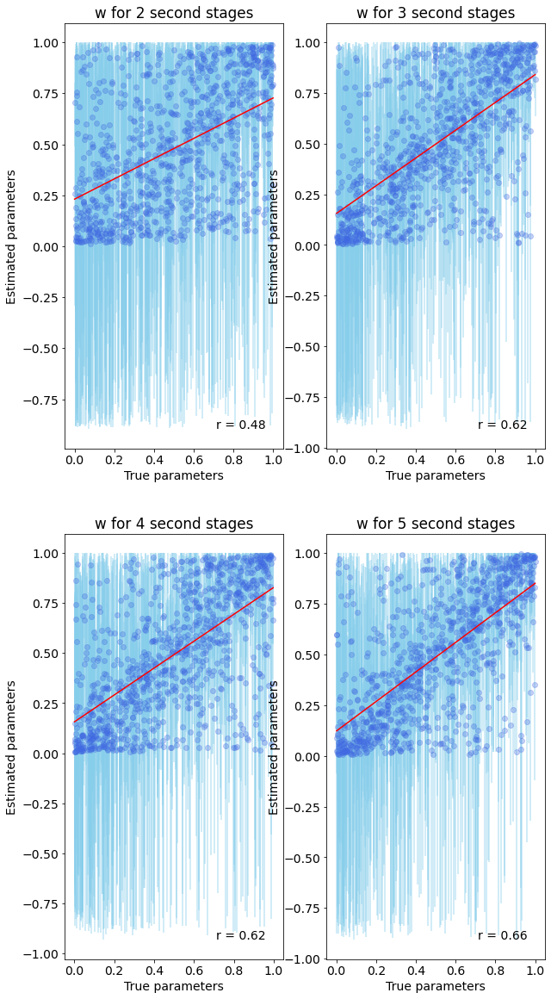

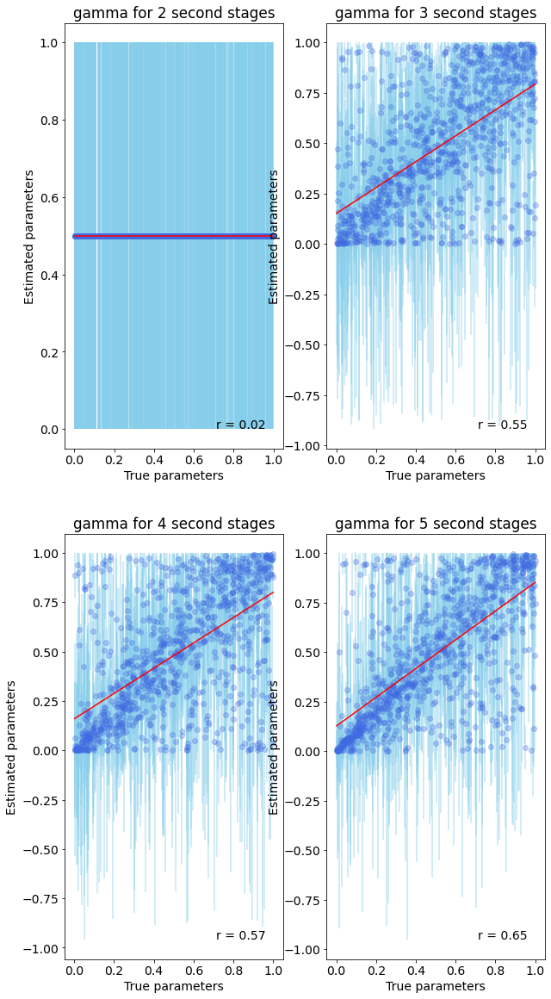

In [16]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'kappa', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_moretrials_diff_lr_' + str(second_stages[s]) + 'states_5params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
#             lower_bound = 0.001
            upper_bound = 10
        transformed_param = transform_params(x,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2
        
#         corr_coef = np.corrcoef(x,y)[0,1]
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
        print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

for i in datatable:
    print(i)